In [7]:
import sys # for automation and parallelization: set manual to false when run by a launcher
import json
default = {'scenario': 'port-moresby','training_folder':'../..'} # Default execution parameters
manual, argv = (True, default) if 'ipykernel' in sys.argv[0] else (False, dict(default, **json.loads(sys.argv[1])))


In [8]:
import os
import time
import geopandas as gpd
import pandas as pd
import numpy as np
sys.path.insert(0, r'../../../quetzal') # Add path to quetzal
from sklearn.neighbors import NearestNeighbors
from numba import jit, njit
import numba as nb
from quetzal.model import stepmodel
from shapely.geometry import LineString
from quetzal.io.gtfs_reader.importer import get_epsg
from quetzal.io import excel
on_lambda = bool(os.environ.get('AWS_EXECUTION_ENV'))
num_cores = nb.config.NUMBA_NUM_THREADS
print('num cores:',num_cores)

io_engine= 'pyogrio' if on_lambda else 'pyogrio' #or fiona

num cores: 8


In [9]:
scenario = argv['scenario']

on_lambda = bool(os.environ.get('AWS_EXECUTION_ENV'))
print('On Lambda : ', on_lambda)

training_folder = argv['training_folder']
input_folder = training_folder +r'/inputs/'

if not on_lambda:
    scenario_folder = training_folder + '/scenarios/' + scenario + '/inputs/'
    output_folder = training_folder + '/scenarios/' + scenario + '/outputs/'
    model_folder = training_folder + '/scenarios/' + scenario + '/model/'
else:
    scenario_folder = input_folder
    output_folder = training_folder + '/outputs/'
    model_folder = training_folder + '/model/'
print('input folder: ', input_folder)
print('output folder: ', output_folder)
print('scen folder : ', scenario_folder)
print('model folder : ', model_folder)

On Lambda :  False
input folder:  ../../inputs/
output folder:  ../../scenarios/port-moresby/outputs/
scen folder :  ../../scenarios/port-moresby/inputs/
model folder :  ../../scenarios/port-moresby/model/


In [10]:
if 'params' in argv.keys():
    scenario = argv['params']['general']['scenario'] #'params':{'general':{'scenario':'ref2023'}}
    var = excel.read_var(file=input_folder+'parameters.xlsx', scenario=scenario, return_ancestry=False)
    var.update(pd.DataFrame.from_dict(argv['params'], orient="index").stack())
else:
    var = excel.read_var(file=input_folder+'parameters.xlsx', scenario=scenario, return_ancestry=False)
    

# import model

In [11]:
sm = stepmodel.read_zippedpickles(model_folder +'los')
sm.segments = ['car_owner', 'pt_captive'] 


zones: 100%|██████████| 28/28 [00:00<00:00, 78.01it/s]     


In [12]:
kwargs = var['preparation_logit'].to_dict()

utility_scale = var['preparation_logit']['time']
kwargs['transfers'] = -kwargs['transfers']/utility_scale # From min/transfer to pt/transfer
kwargs['price'] = -60/kwargs['price']/utility_scale # From 
kwargs['time'] = -1/utility_scale/60 # From min/pt to pt/sec



In [13]:
sm.preparation_logit(
    segments=['car_owner', 'pt_captive'],
    **kwargs
)

In [14]:
sm.utility_values.T

value,time,price,ntransfers,mode_utility
segment,,,,
root,-0.000833,-0.2,-0.25,1.0
car_owner,-0.000833,-0.2,-0.25,1.0
pt_captive,-0.000833,-0.2,-0.25,1.0


In [15]:
sm.logit_scales.T 

route_type,car,NCD,PMV,root,walk,pt
segment,,,,,,
root,0.0,0.1,0.1,1.0,0.0,0.5
car_owner,0.0,0.1,0.1,1.0,0.0,0.5
pt_captive,0.0,0.1,0.1,1.0,0.0,0.5


In [16]:
sm.mode_utility.T

route_type,car,NCD,PMV,root,walk
segment,,,,,
root,0,0,0,0,0
car_owner,0,0,0,0,0
pt_captive,0,0,0,0,0


In [17]:
sm.mode_utility.loc[:,['pt_captive']] = var.mode_utility_pt
sm.mode_utility.loc[:,['car_owner']] = var.mode_utility_car
sm.mode_utility= sm.mode_utility.fillna(0)

In [18]:
sm.mode_utility.T

route_type,car,NCD,PMV,root,walk
segment,,,,,
root,0.0,0.0,0.0,0.0,0.0
car_owner,0.0,0.0,0.0,0.0,0.0
pt_captive,-100.0,0.0,0.0,0.0,0.0


In [19]:
sm.mode_nests.T 

route_type,car,NCD,PMV,root,walk,pt
segment,,,,,,
root,root,pt,pt,NaN,root,root
car_owner,root,pt,pt,NaN,root,root
pt_captive,root,pt,pt,NaN,root,root


In [20]:
sm.pt_los['ntransfers'] = sm.pt_los['alighting_links'].apply(lambda x: max(len(x)-1, 0))
sm.pt_los['price'] = 0 ######
sm.car_los['ntransfers'] = 0
sm.car_los['price'] = 0

In [21]:
sm.analysis_pt_time(
        boarding_time=None,
        alighting_time=None,
        walk_on_road=True,
    )
 

sm.analysis_car_route_type() 

sm.los = pd.concat([sm.pt_los, sm.car_los]).reset_index(drop=True)
sm.los['path'] = sm.los['path'].apply(lambda p: tuple(p)) 


sm.analysis_mode_utility(how='mean')

100%|██████████| 2/2 [00:00<00:00, 360.99it/s]


In [22]:
#sm.los = sm.los.loc[~(sm.los['route_type']=='walk') | (sm.los['time'] < 2700)]

In [23]:
sm.initialize_logit()
sm.step_logit()

100%|██████████| 10/10 [00:00<00:00, 30.65it/s]


In [24]:
sm.probabilities

route_type,origin,destination,segment,root,walk,car,pt,PMV,NCD
0,zone_11,zone_0,car_owner,1,0.000000,0.0,1.000000,1.000000,0.000000
1,zone_11,zone_0,pt_captive,1,0.000000,0.0,1.000000,1.000000,0.000000
2,zone_11,zone_1,car_owner,1,0.003757,0.0,0.996243,0.995171,0.001072
3,zone_11,zone_1,pt_captive,1,0.003757,0.0,0.996243,0.995171,0.001072
4,zone_11,zone_10,car_owner,1,0.000000,0.0,1.000000,1.000000,0.000000
...,...,...,...,...,...,...,...,...,...
393,zone_48,zone_7,pt_captive,1,1.000000,0.0,0.000000,0.000000,0.000000
394,zone_48,zone_8,car_owner,1,0.000000,0.0,0.000000,0.000000,0.000000
395,zone_48,zone_8,pt_captive,1,0.000000,0.0,0.000000,0.000000,0.000000
396,zone_48,zone_9,car_owner,1,0.029613,0.0,0.970387,0.790435,0.179952


In [25]:
sm.volumes.fillna(0, inplace=True)
sm.compute_los_volume(keep_segments=False)

In [26]:
sm.car_los = sm.los.loc[sm.los['route_type'] == 'car']
sm.pt_los = sm.los.loc[sm.los['route_type'] != 'car']

In [27]:
sm.step_pt_assignment(
    road = True,
    boardings=True,
    alightings=True,
    transfers=True
)

pt_captive: 100%|██████████| 2/2 [00:00<00:00,  7.20it/s]


In [28]:
#sm.to_zippedpickles(model_folder + 'logit_assignment')

In [29]:
capacity_dict={'motorway':2000, 
               'motorway_link':1500, 
               'trunk':1000, 
               'trunk_link':1000, 
               'primary':1000, 
               'primary_link':1000,
               'secondary':1000, 
               'secondary_link':1000, 
               'tertiary':600,
               'tertiary_link':600, 
               'residential':600, 
               'unclassified':600, 
                   
}

peak_hour_intensity = 1.5 #  peak hour compared to period
period_duration = 3


sm.road_links['cap'] = sm.road_links['highway'].apply(lambda x: capacity_dict.get(x,1500))
sm.road_links['capacity'] = sm.road_links['cap']*sm.road_links['lanes'] * (period_duration / peak_hour_intensity) 
sm.road_links['time_ff'] = sm.road_links['length']/(sm.road_links['here_speed']*1000/3600)
#sm.road_links['capacity'] = np.inf
#sm.road_links['speed_ff'] = sm.road_links['here_speed']


'''
links['speed_ff'] = links['highway'].apply(lambda x: speed_fudge.get(x))
links['speed_ff'] = links['speed_ff']*links['maxspeed']
links['time_ff'] = links['length']/(links['speed_ff']*1000/3600)
'''

"\nlinks['speed_ff'] = links['highway'].apply(lambda x: speed_fudge.get(x))\nlinks['speed_ff'] = links['speed_ff']*links['maxspeed']\nlinks['time_ff'] = links['length']/(links['speed_ff']*1000/3600)\n"

In [30]:
v = sm.volumes.set_index(['origin', 'destination'])[['car_owner']]
od_set = set(v.loc[(v > 0).sum(axis=1) > 0].index)

sm.step_road_pathfinder(
    tolerance=0.01,
    maxiters=20,
    num_cores=1,
   volume_column= 'car_owner',
    time_column='time_ff',
    path_analysis=False)

sm.car_los = sm.car_los.merge(v, left_on=['origin', 'destination'], right_index=True)

vdf not found in road_links columns. Values set to 'default_bpr'
alpha not found in road_links columns. Values set to 0.15
beta not found in road_links columns. Values set to 4
limit not found in road_links columns. Values set to 20
penalty not found in road_links columns. Values set to 0


In [31]:
sm.analysis_car_route_type() 
sm.los = pd.concat([sm.pt_los, sm.car_los]).reset_index(drop=True)
sm.los['path'] = sm.los['path'].apply(lambda p: tuple(p)) 


In [32]:
sm.car_los = sm.los.loc[sm.los['route_type'] == 'car']

In [33]:
sm.step_car_assignment

<bound method TransportModel.step_car_assignment of <quetzal.model.stepmodel.StepModel object at 0x7f2ed9fe3790>>

In [35]:
sm.to_zippedpickles(model_folder + 'logit_assignment')

relgap: 100%|██████████| 40/40 [00:01<00:00, 33.17it/s]    


sm.links.rename(columns={'load': 'volume'}, inplace=True)
sm.analysis_pt_length(
     walk_on_road=True
)
sm.analysis_car_length()
sm.analysis_pt_time(
     walk_on_road=True
)

# stack

sm.summary_link_max(inplace=True)
sm.summary_link_sum(inplace=True)
sm.summary_od(inplace=True)
sm.los = pd.concat([sm.pt_los, sm.car_los]).reset_index(drop=True)

sm.summary_path_average(inplace=True)
sm.summary_aggregated_path_average(inplace=True, pt_route_types=['subway', 'bus', 'tram', 'rail'])
sm.summary_path_sum(inplace=True)

s = sm.stack_link_sum.unstack([-1, -2]).groupby(level=0).sum().stack([0, 1])
s.name = 'sum'
sm.stack_aggregated_link_sum = s 
s = sm.stack_link_max.unstack().groupby(level=0).max().stack()
s.name = 'max'
sm.stack_aggregated_link_max = s

In [36]:
if var["calibration"]["sortie"] == False:
    end_of_notebook

# Calibration

In [37]:
from syspy.syspy_utils.pandas_utils import groupby_weighted_average
from syspy.spatial.spatial import nearest_geometry
import matplotlib.pyplot as plt
def near_nodes(nodes,zones,div_neighbors = 2):
    node_proxim = nearest_geometry(nodes,zones,n_neighbors = int(len(zones)/div_neighbors),n_neighbors_centroid = int(len(zones)/div_neighbors))
    node_proxim = node_proxim.sort_values(by = "actual_distance")
    node_proxim =  node_proxim.drop_duplicates(["ix_one"])
    return(node_proxim.set_index(["ix_one"])["ix_many"].to_dict())

In [38]:
los = sm.los[['origin', 'destination','route_type', 'volume']]
los = los.groupby(['origin', 'route_type']).sum()
los = los.unstack('route_type')['volume']
los.columns = los.columns.values
los['volume'] = los.sum(axis=1)
los['pt'] = los[list(set(los.columns) - {'car', 'walk', 'volume'})].sum(axis=1)

los['part_car'] = los['car']/los[['car', 'pt', 'walk']].sum(axis=1) 
los['part_pt'] = los['pt']/los[['car', 'pt', 'walk']].sum(axis=1) 
los['part_walk'] = los['walk']/los[['car', 'pt', 'walk']].sum(axis=1) 
part_model = los[['part_car', 'part_pt', 'part_walk','volume']]

In [39]:
zones_before_clustering = sm.zones_before_clustering.copy()
zones_before_clustering["cluster"] = 'zone_' + zones_before_clustering["cluster"].astype(str) 
zones = zones_before_clustering

In [40]:
# part modale model sub_mode
print("part modale model"+ '\n',((sm.los.groupby("route_type")["volume"].sum()/sm.los["volume"].sum())*100).round(2).astype(str))

part modale model
 route_type
NCD     14.45
PMV     69.96
car       0.0
walk     15.6
Name: volume, dtype: object


### macro

In [41]:
macro_file = scenario_folder  + r'calibration/zones_macro.geojson'
macro_file_provided = os.path.isfile(macro_file)
if macro_file_provided:
    import shapely as shp
    macro_zones = gpd.read_file(macro_file).to_crs(sm.zones.crs)

    macro_zones = macro_zones.groupby("macro_zones")['geometry'].apply(shp.ops.cascaded_union)
    centroid = gpd.GeoDataFrame(sm.zones.centroid).rename(columns = {0:"geometry"})
    
    dico_macro_zones = near_nodes(centroid,macro_zones)

nearest_link: 100%|██████████| 464/464 [00:00<00:00, 158185.57it/s]


## Import calibration data

In [42]:
calib_folder = scenario_folder  + r'calibration/'
calib_file = scenario_folder  + r'calibration/part_modale_calibration.csv'
calib_file_provided = os.path.isfile(calib_file)
if calib_file_provided:
    part_calibration_zone_bc = pd.read_csv(calib_file).set_index("index")
    
    part_calibration = part_calibration_zone_bc.merge(zones["cluster"], left_index = True, right_index = True, how = "left").set_index("cluster")
    part_calibration = groupby_weighted_average(part_calibration, part_calibration.index , ['part_car', 'part_pt', 'part_walk'], 'volumes_calibration')

In [43]:
if calib_file_provided:
    sm.zones.loc[part_calibration.index]['population'].sum(), sm.zones['population'].sum()

In [44]:
# il peut manquer des zones à la calibration
if calib_file_provided:
    ax = sm.zones.plot()
    sm.zones.loc[part_calibration.index].plot(color ="r" ,ax =ax)

In [45]:
if calib_file_provided:
    comp_part_modale = part_calibration.merge(part_model, left_index=True, right_index=True, suffixes=('_calibration', '_model')).fillna(0)
    if macro_file_provided:
            comp_part_modale_macro = comp_part_modale .copy()
            comp_part_modale_macro.index = comp_part_modale_macro.index.to_series().apply(lambda x : dico_macro_zones[x])
            volume_macro_zone = comp_part_modale_macro.groupby(comp_part_modale_macro.index)["volume"].sum().to_dict()
            comp_part_modale_macro = groupby_weighted_average(comp_part_modale_macro, comp_part_modale_macro.index, list(set(comp_part_modale_macro.columns) -  {'volume'}), 'volume')
            comp_part_modale_macro["volume"] = comp_part_modale_macro.index.to_series().apply(lambda x : volume_macro_zone[x])
            comp_part_modale_macro = comp_part_modale_macro.sort_values(by = "volume",ascending = False)
else:
    comp_part_modale = part_model.fillna(0)
    if macro_file_provided:
        comp_part_modale_macro =  comp_part_modale.copy()
        comp_part_modale_macro.index = comp_part_modale_macro.index.to_series().apply(lambda x : dico_macro_zones[x])
        volume_macro_zone = comp_part_modale_macro.groupby(comp_part_modale_macro.index)["volume"].sum().to_dict()
        comp_part_modale_macro = groupby_weighted_average(comp_part_modale_macro, comp_part_modale_macro.index, list(set(comp_part_modale_macro.columns) -  {'volume'}), 'volume')
        comp_part_modale_macro["volume"] = comp_part_modale_macro.index.to_series().apply(lambda x : volume_macro_zone[x])
        comp_part_modale_macro = comp_part_modale_macro.sort_values(by = "volume",ascending = False)
        comp_part_modale_macro = comp_part_modale_macro* 100

### sortie part modale pondérée globale

In [46]:
print("part modale model"+ '\n',((part_model[["part_car","part_pt","part_walk"]] * part_model[["volume"]].values).sum()/part_model[["volume"]].sum().sum()*100).round(2))

part modale model
 part_car      0.0
part_pt      84.4
part_walk    15.6
dtype: float64


In [47]:
if calib_file_provided:
     print("part modale calibration"+ '\n',(( part_calibration_zone_bc[["part_car","part_pt","part_walk"]] *  part_calibration_zone_bc[["volumes_calibration"]].values).sum()/ part_calibration_zone_bc[["volumes_calibration"]].sum().sum()*100).round(2))

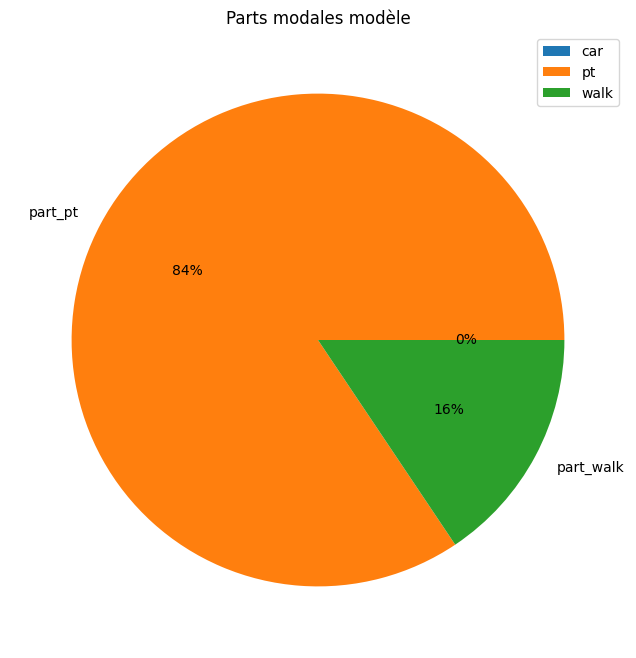

In [48]:
(((part_model[["part_car","part_pt","part_walk"]] * part_model[["volume"]].values).sum()/part_model[["volume"]].sum().sum()*100).round(2)).plot(kind='pie', autopct='%1.0f%%', figsize=[8,8])
plt.title('Parts modales modèle')
plt.legend(['car', 'pt', 'walk'])
plt.savefig(output_folder+'Parts_modales_modèle.png',bbox_inches='tight', dpi=150)


In [49]:
if calib_file_provided:
    (((part_calibration_zone_bc[["part_car","part_pt","part_walk"]] *  part_calibration_zone_bc[["volumes_calibration"]].values).sum()/ part_calibration_zone_bc[["volumes_calibration"]].sum().sum()*100).round(2)).plot(kind='pie', autopct='%1.0f%%', figsize=[8,8])
    plt.title('Parts modales calibration')
    plt.legend(['car', 'pt', 'walk'])

## histrogramme compar macrozones

In [50]:
colors = ["#cf6006", "#3481ed" , "#fad83e", "#8dd0fc","#8C4B7D", "#A08C69","#647D6E", "#5A7382", "#64411E", "#A00037", "#643C5A"]  

In [51]:
comp_part_modale.corr()

,part_car,part_pt,part_walk,volume
part_car,NaN,NaN,NaN,NaN
part_pt,NaN,1.000000,-0.503955,0.191022
part_walk,NaN,-0.503955,1.000000,-0.071665
volume,NaN,0.191022,-0.071665,1.000000


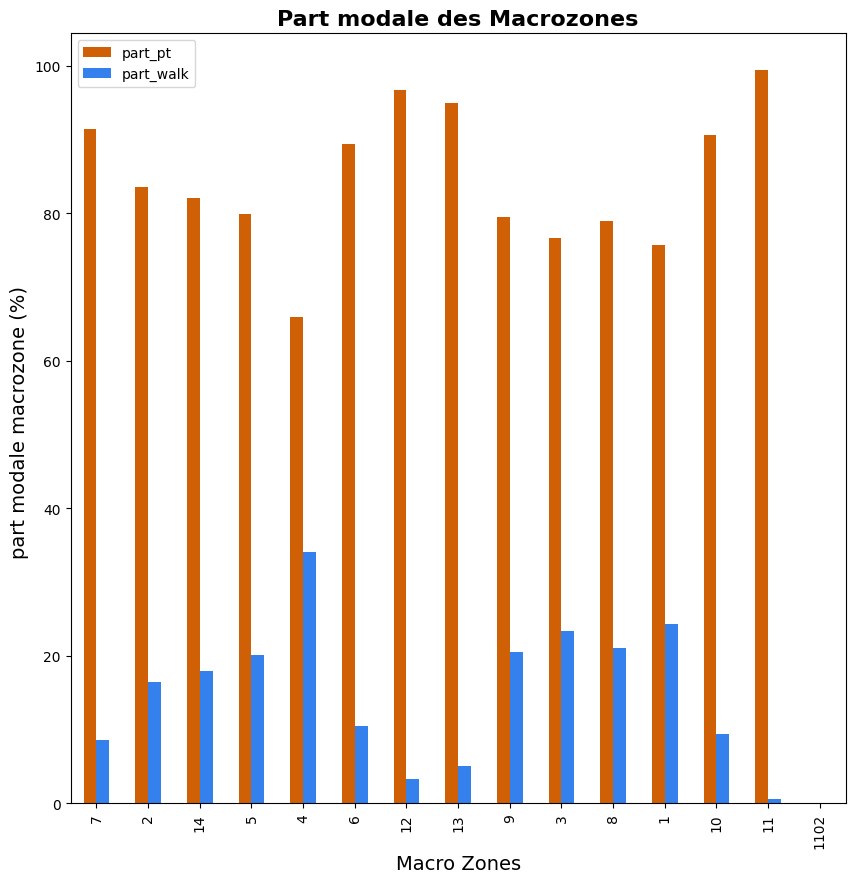

In [52]:

if macro_file_provided and calib_file_provided :
    comp_part_modale_macro[['part_pt_calibration','part_pt_model','part_walk_calibration','part_walk_model']].plot( kind = 'bar', figsize=[10, 10],color = colors)
    plt.xlabel('Macro Zones', fontsize=14)
    plt.ylabel('part modale macrozone (%) ', fontsize=14)
    plt.title('Part modale des Macrozones', loc='center', fontsize=16, fontweight="bold")
    plt.savefig(output_folder+'part_modale_macrozones.png',bbox_inches='tight', dpi=150)
    plt.show()
elif macro_file_provided:
    comp_part_modale_macro[['part_pt','part_walk']].plot( kind = 'bar', figsize=[10, 10],color = colors)
    plt.xlabel('Macro Zones', fontsize=14)
    plt.ylabel('part modale macrozone (%) ', fontsize=14)
    plt.title('Part modale des Macrozones', loc='center', fontsize=16, fontweight="bold")
    plt.savefig(output_folder+'part_modale_macrozones.png',bbox_inches='tight', dpi=150)
    plt.show()

In [53]:
if macro_file_provided:
    pt_los_macro = sm.pt_los.copy()
    pt_los_macro['macro_origin'] = pt_los_macro['origin'].map(dico_macro_zones)
    pt_los_macro['macro_destination'] = pt_los_macro['destination'].map(dico_macro_zones)
    pt_los_macro.groupby('macro_origin')['time'].mean()

# boardings

In [54]:
calib_file__boardings_provided = os.path.isfile(input_folder + scenario + '/calibration/''calib_boardings.csv')
if calib_file__boardings_provided: 
    calib_boardings = pd.read_csv(input_folder + scenario + '/calibration/''calib_boardings.csv')


In [55]:
sm.links.groupby(['route_type'])['boardings'].sum()

route_type
NCD    208082.823436
PMV    695126.155944
Name: boardings, dtype: float64

In [56]:
sm.links.groupby(['agency_id'])['boardings'].sum()

agency_id
NCD    208082.823436
PMV    695126.155944
Name: boardings, dtype: float64

In [57]:
sm.links.groupby('route_id')['boardings'].sum()

route_id
EDA1     80205.452649
EDA2     13829.795072
EDA3     38405.467912
EDA4     55787.386120
EDA5     19854.721683
R04       1265.894480
R06      14992.179349
R07      35631.894733
R09      51321.895566
R10      32976.197816
R11      50061.187554
R12      46125.606536
R13     102361.683027
R15     153475.384444
R16      92201.869655
R17      12138.215110
R19      43744.401421
R20      35608.719236
RTA      23221.027019
Name: boardings, dtype: float64

In [58]:
sm.links.loc[sm.links['agency_id'] == 'QUENEDI'].groupby('route_id')['boardings'].sum()

Series([], Name: boardings, dtype: float64)

In [59]:
if os.path.isfile(calib_file+ 'calib_boardings_bus.csv'):
    bus = pd.read_csv(calib_folder + 'calib_boardings_bus.csv') 
    bus.plot()

In [60]:
stop

NameError: name 'stop' is not defined

## Od analysis

In [ ]:
sm.analysis_pt_time(
     walk_on_road=True
)

In [ ]:
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

In [ ]:
od_file = scenario_folder + 'od/od.geojson'
od_file_provided = os.path.isfile(od_file)
if od_file_provided and manual:
    od_test = gpd.read_file(od_file)
    from shapely.geometry import Point
    from syspy.spatial.spatial import nearest, agglomerative_clustering, voronoi_diagram_dataframes, add_geometry_coordinates
    od_test['geometry_o'] = od_test['geometry'].apply(lambda g: Point(g.coords[:][0]))
    od_test['geometry_d'] = od_test['geometry'].apply(lambda g: Point(g.coords[:][1]))
    # find nearest node with KNN. nodes are now the origin and destination.
    od_test['geometry'] = od_test['geometry_o']
    neigh = nearest(od_test, sm.zones.to_crs(4326), n_neighbors=1).rename(columns={'ix_one': 'zone_index', 'ix_many': 'node_index'})
    zone_node_dict = neigh.set_index('zone_index')['node_index'].to_dict()
    od_test['origin'] = od_test.index.map(zone_node_dict.get)

    od_test['geometry'] = od_test['geometry_d']
    neigh = nearest(od_test, sm.zones.to_crs(4326), n_neighbors=1).rename(columns={'ix_one': 'zone_index', 'ix_many': 'node_index'})
    zone_node_dict = neigh.set_index('zone_index')['node_index'].to_dict()
    od_test['destination'] = od_test.index.map(zone_node_dict.get)

    od_test = od_test.drop(columns=['geometry_o','geometry_d','geometry'])
    od_test = od_test.drop(columns=['index'])

    od_list = od_test[['origin','destination','name']].values.tolist()
    


Reprojecting model from epsg 32755 to epsg 3857: 100%|██████████| 39/39 [00:01<00:00, 35.25it/s]


no path found for OD = zone_36 zone_32


100%|██████████| 2/2 [00:00<00:00,  2.84it/s]


no path found for OD = zone_36 zone_4


100%|██████████| 1/1 [00:00<00:00,  4.58it/s]


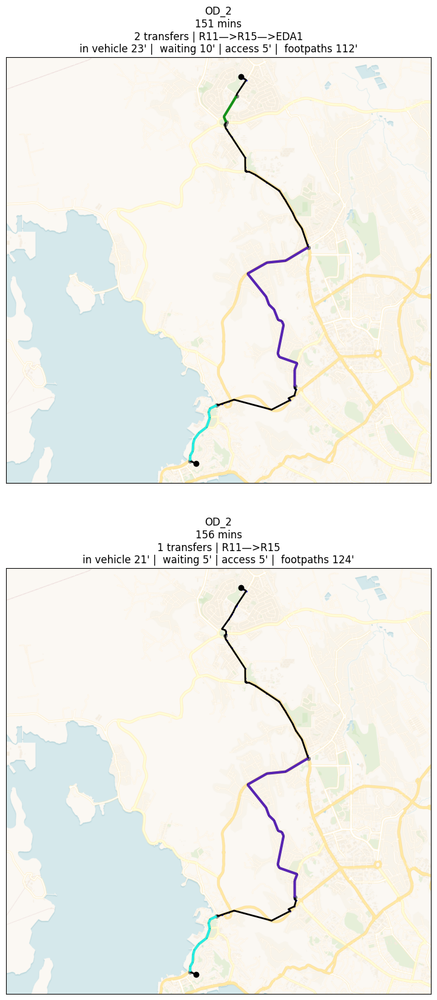

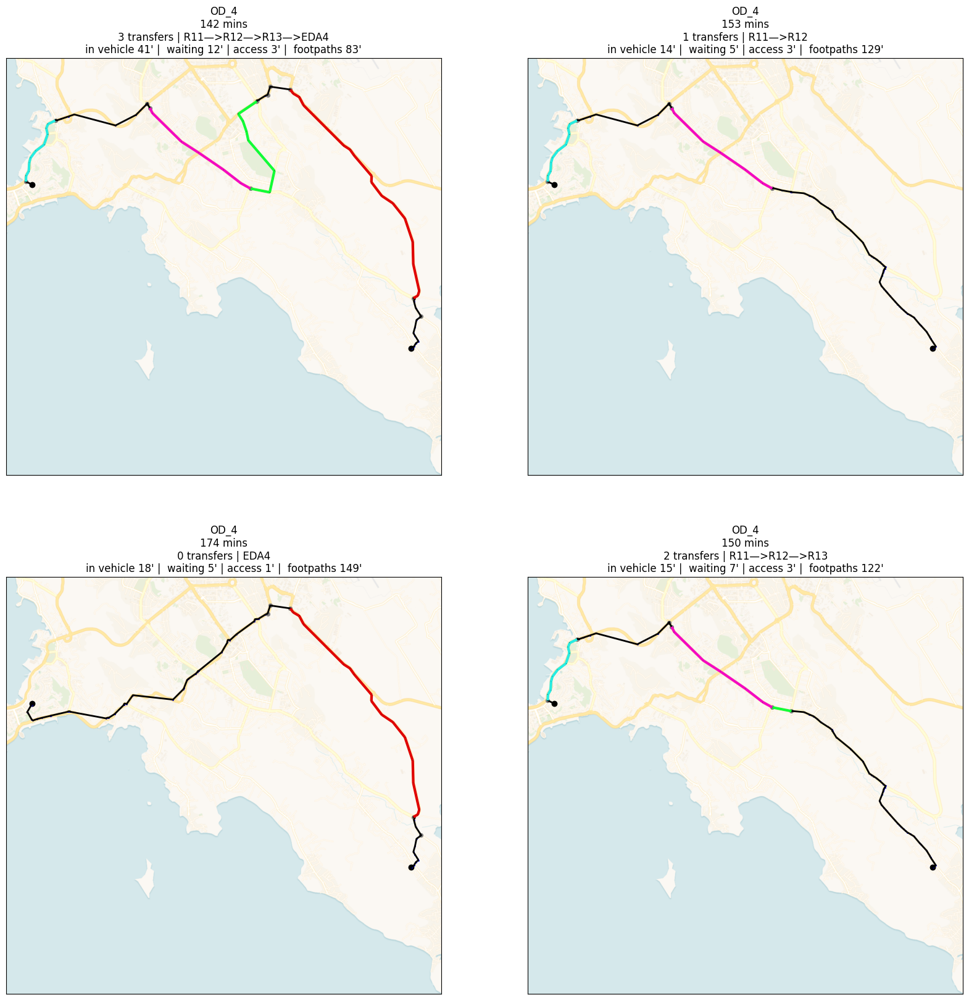

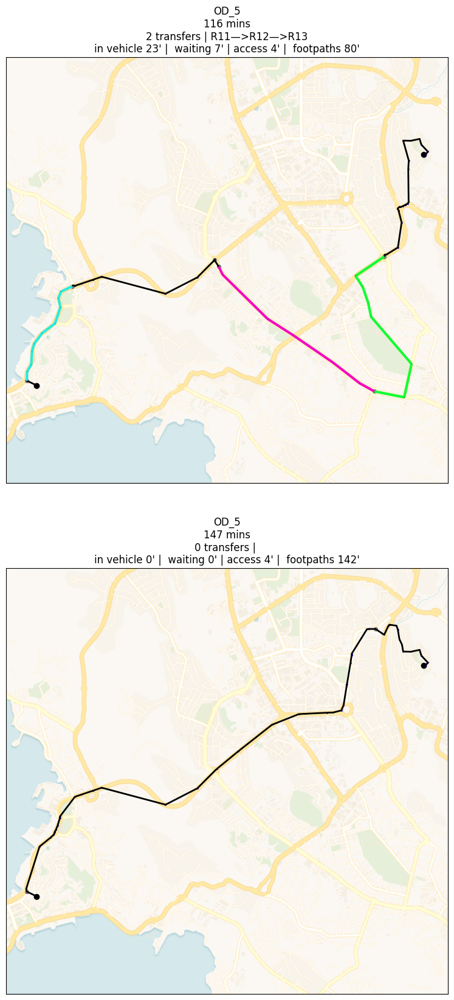

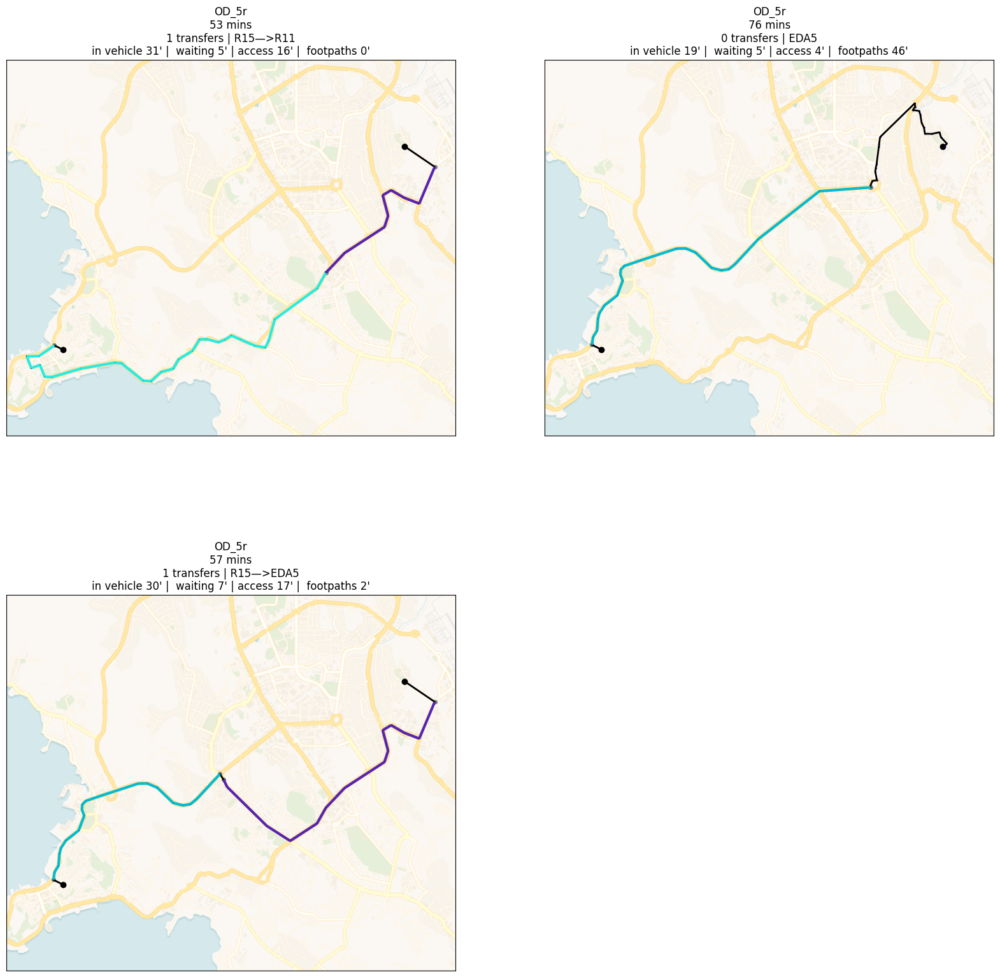

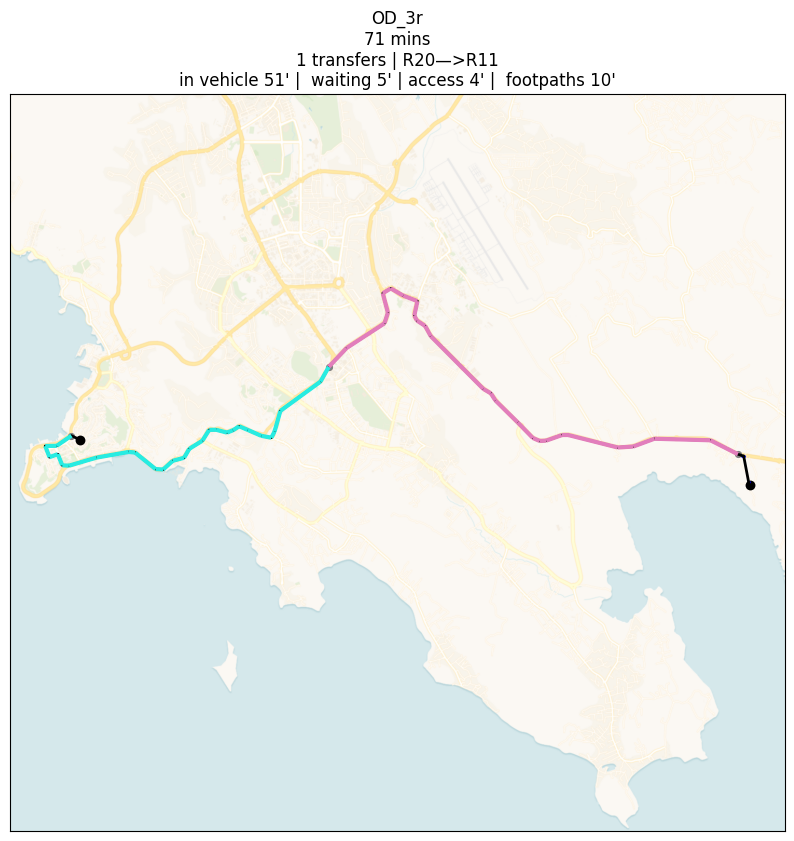

...

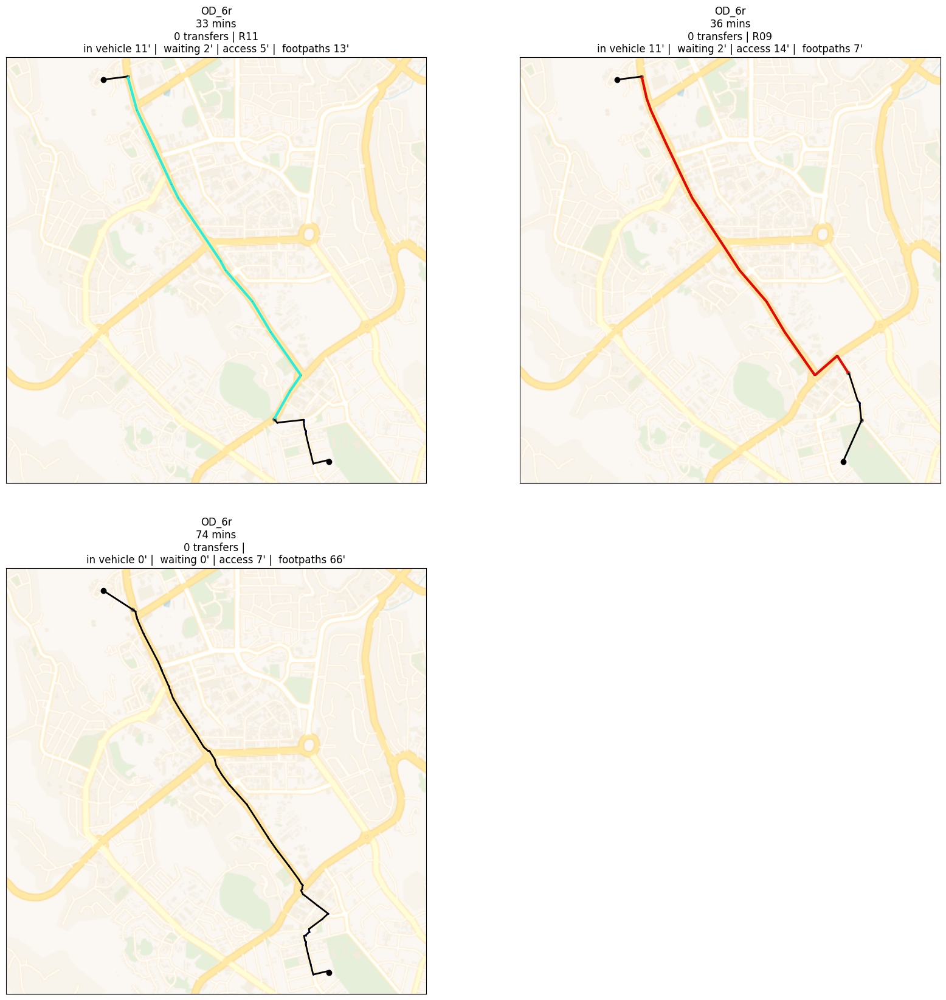

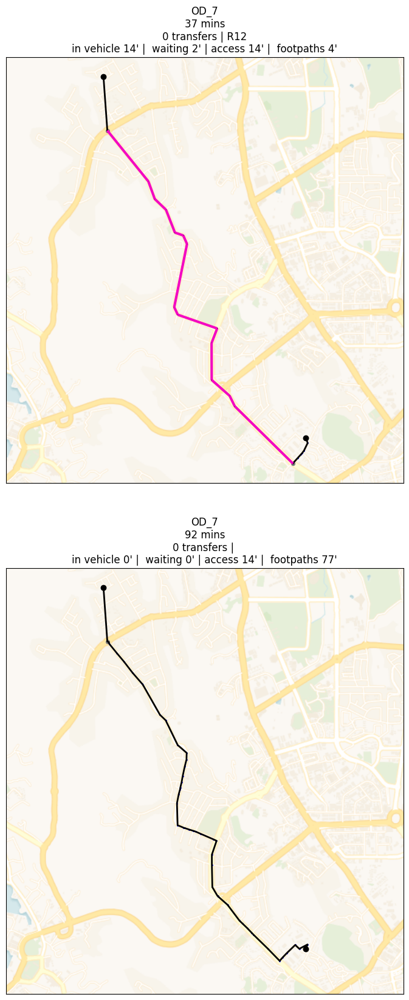

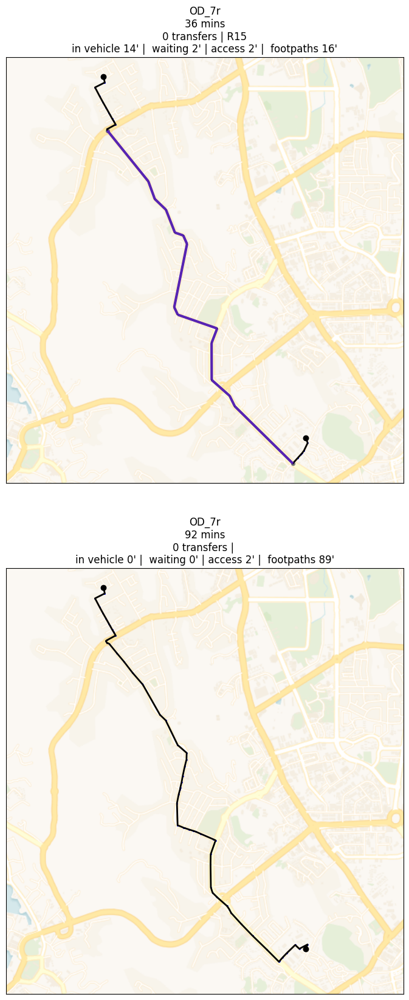

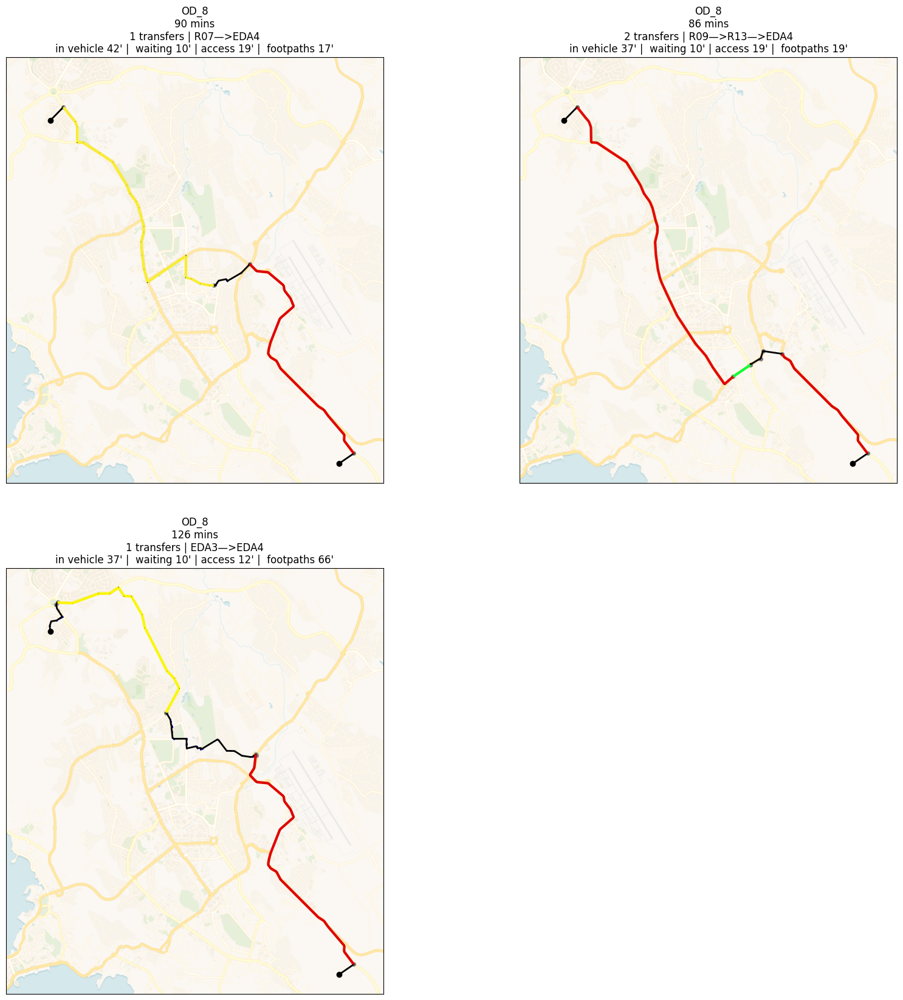

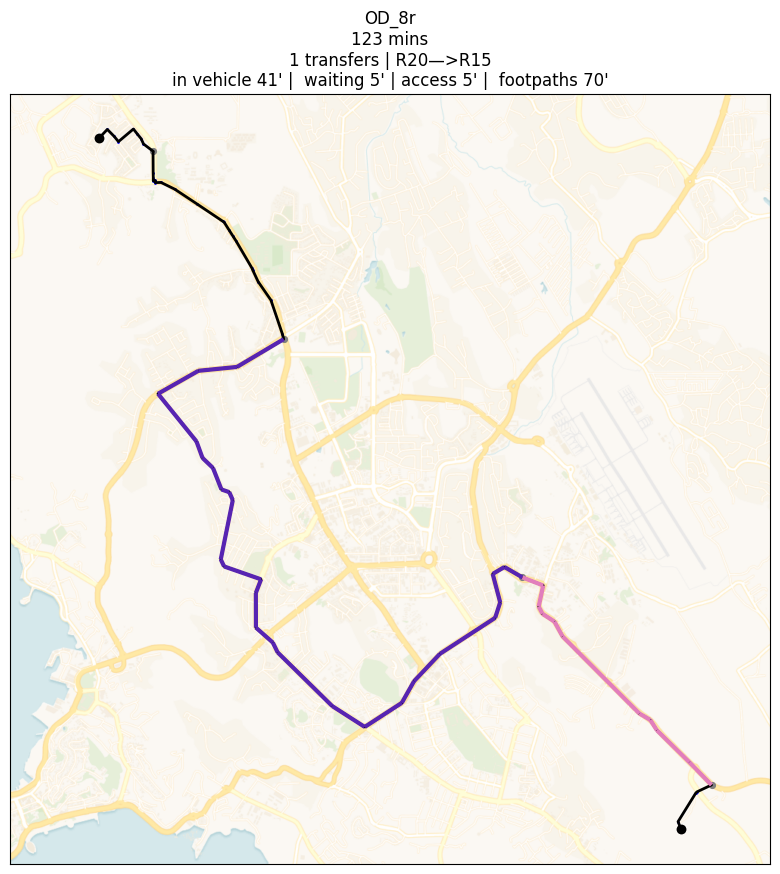

In [ ]:
if manual:
    import matplotlib.pyplot as plt

    plot_sm = sm.copy()
    plot_sm.analysis_pt_time(
        walk_on_road=True
    )
    
    los = plot_sm.pt_los
    link_routes = plot_sm.links['route_short_name'].to_dict()
    def link_path_to_routes(link_path):
        routes = [link_routes[l] for l in link_path]
        used = set()
        rsn = []
        for route in routes:
            if route not in used:
                rsn.append(route)
            used.add(route)
        return rsn
    los['route_path'] = los['link_path'].apply(link_path_to_routes)

    def title(paths):
        paths['min'] = np.round(paths['time'] / 60).astype(int)
        mins = (paths[['in_vehicle_time', 'access_time', 'footpath_time', 'waiting_time', 'time']] / 60).astype(int).astype(str)
        title =  paths['min'].astype(str) + ' mins'
        title += '\n' + paths['ntransfers'].astype(str) + ' transfers | '

        title += paths['route_path'].apply(lambda l: '—>'.join(l) )
        title += '\n' + 'in vehicle '+ mins['in_vehicle_time']+ "' | " + ' waiting '+ mins['waiting_time']+ "' | "  
        title += 'access ' + mins['access_time']+ "' | "   + ' footpaths '  + mins['footpath_time']+ "'"   
        return title
    los['title'] = title(los)


    los = los.loc[los[('pt_captive', 'probability')] > 0.01]
    plot_sm.pt_los = los.sort_values(('pt_captive', 'probability'), ascending=False)

    plot_sm = plot_sm.change_epsg(epsg =3857, coordinates_unit = 'meter')

    plot_sm.links['color'] = '#' +plot_sm.links['route_color']

    styles = plot_sm.get_geometries()

    for o,d, name in od_list:
        try:
            origin, destination= o, d
            n =  len(plot_sm.pt_los.set_index(['origin', 'destination']).loc[[(origin, destination)]])
            rows = 1
            if n > 1:
                rows = 2
            if n > 6:
                rows = 3
            if n > 12:
                rows = 4
   
            columns = n // rows + bool(n%rows)
   
            url = 'http://a.basemaps.cartocdn.com/rastertiles/voyager_nolabels/{z}/{x}/{y}.png'
            fig, axes = plot_sm.plot_separated_paths(
                origin, destination, rows=rows, figsize=[10*columns, 10*rows],
                title='title', constrained_layout=False, styles = styles,
                basemap_url=url, zoom=14, squared=True,
            )
            for ax in axes:
                ax.set_title(name + '\n' + ax.get_title())
            png = output_folder+ 'OD_PT_' + name + '.png'
            fig.savefig(png, bbox_inches='tight')
        except KeyError:
            print('no path found for OD =', origin, destination)
            pass

In [ ]:
#sm.zone = zones_poly

import matplotlib.pyplot as plt

if manual:
    plot_sm = sm.copy()
    los = plot_sm.pt_los.copy()
    los = los.loc[los[('pt_captive', 'probability')] > 0.01]
    plot_sm.pt_los = los.sort_values(('pt_captive', 'probability'), ascending=False)
    sm.pt_los = sm.pt_los.sort_values(('pt_captive', 'probability'), ascending=False)

    plot_sm = plot_sm.change_epsg(epsg =3857, coordinates_unit = 'meter')

    plot_sm.links['color'] = '#' +plot_sm.links['route_color']
    speeds = plot_sm.road_links['speed']
    norm = plt.Normalize(50, 100)
    cmap = plt.get_cmap('RdYlGn')
    colors = cmap(norm(speeds))
    plot_sm.road_links['color'] = [tuple(c) for c in colors]
    plot_sm.road_links['width'] = 2

    plot_sm.car_los['title'] = (plot_sm.car_los['time'] / 60).astype(str) + ' mins'

    styles = plot_sm.get_geometries()

    for o,d, name in od_list:
        try:
            origin, destination= o, d
            n =  len(plot_sm.pt_los.set_index(['origin', 'destination']).loc[[(origin, destination)]])
            rows = 1
            if n > 1:
                rows = 2
            if n > 6:
                rows = 3
            if n > 12:
                rows = 4
   
            columns = n // rows + bool(n%rows)
   
            url = 'http://a.basemaps.cartocdn.com/light_nolabels/{z}/{x}/{y}.png'
            fig, axes = plot_sm.plot_separated_paths(
                origin, destination, rows=rows, figsize=[10*columns, 10*rows],
                title='title', constrained_layout=False, styles = styles,
                basemap_url=url, zoom=14, squared=True,
            )
            for ax in axes:
                ax.set_title(name + '\n' + ax.get_title())
            png = output_folder+ 'OD_PT_' + name + '.png'
            fig.savefig(png, bbox_inches='tight')
        except KeyError:
            print('no path found for OD =', origin, destination)
            pass

Reprojecting model from epsg 32755 to epsg 3857: 100%|██████████| 39/39 [00:01<00:00, 33.12it/s]


no path found for OD = zone_36 zone_32
no path found for OD = zone_36 zone_35
no path found for OD = zone_36 zone_4
no path found for OD = zone_36 zone_31
no path found for OD = zone_36 zone_42
no path found for OD = zone_42 zone_36
no path found for OD = zone_4 zone_36
no path found for OD = zone_31 zone_36
no path found for OD = zone_32 zone_36
no path found for OD = zone_35 zone_36
no path found for OD = zone_30 zone_24
no path found for OD = zone_24 zone_30
no path found for OD = zone_44 zone_16
no path found for OD = zone_16 zone_44
no path found for OD = zone_52 zone_29
no path found for OD = zone_29 zone_52


TypeError: can only concatenate tuple (not "float") to tuple

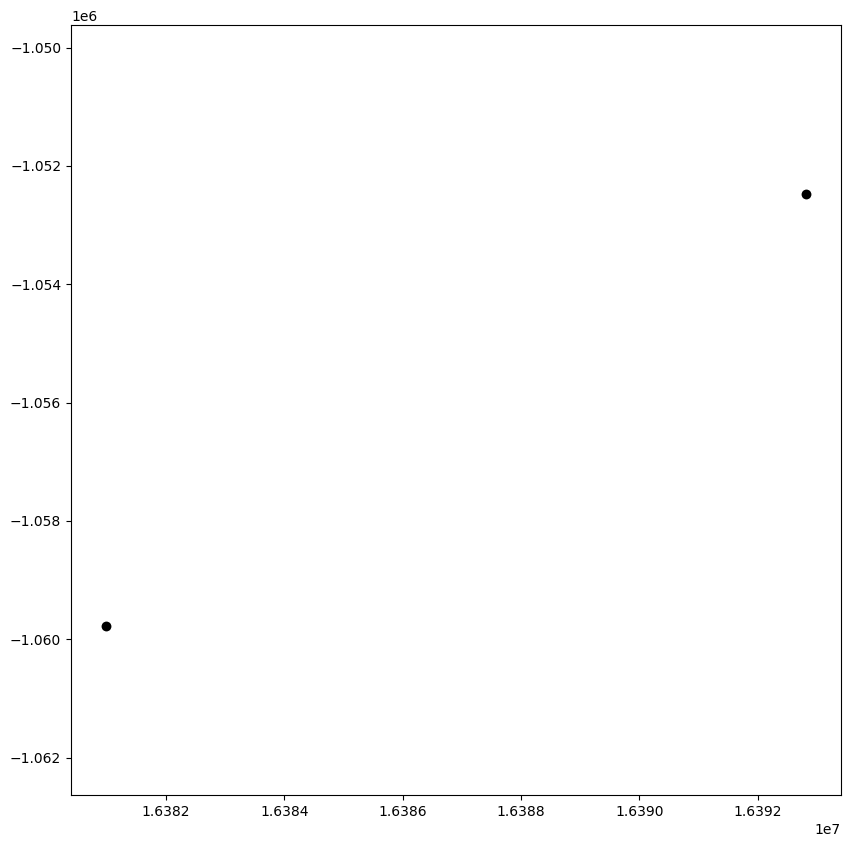

In [ ]:
if manual:
    for o,d, name in od_list:
        url = 'http://a.basemaps.cartocdn.com/dark_nolabels/{z}/{x}/{y}.png'
        ax = plot_sm.plot_car_paths(o, d, figsize=[10, 10], squared=True,
                            basemap_url=url, zoom=14, styles=styles, title='title')
        ax.set_title(name + '\n' + ax.get_title())
        png = output_folder+ 'OD_CAR_' + name + '.png'
        ax.figure.savefig(png, bbox_inches='tight')